[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1x_LWJtEbYjL1gJhg4wlm3lpuj8_6Lex_?usp=sharing)

# **Libraries**

In [ ]:
# Libraries for pre-modelling
import zipfile ## Unzip zip file(s)
import pandas as pd ## Manage dataframe
import os ## Interact with file system
import shutil ## Copy file(s)
import numpy as np ## Handle array
from google.colab import files ## Upload file(s) from local

# Libraries for plot image(s)
%matplotlib inline
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Libraries for machine learning modelling
import tensorflow as tf ## Deep learning library
from tensorflow.keras.preprocessing.image import ImageDataGenerator ## Augment the images

# Others
from tqdm import tqdm ## Display bar progress 
import random ## Get random image(s)
import cv2 ## Preprocess the images

# **Data Preparation & Preprocess**


## About the dataset
The used dataset was provided by [Satria Data 2021 Competition - Big Data Challenge](https://satriadata.ipb.ac.id/). The dataset contains 770 folder, there are 3 images for each folder as a representative for one person. All of those folder have the gender and age labels.

*age* is an integer from 5 up to 50

*gender* is either 0 (woman) or 1 (man)
- The official dataset link : https://drive.google.com/drive/folders/1dl5USk8H96p7XqpeLFdOykKoQrZxuAom?usp=sharing

In [ ]:
# Download and unzip the dataset
!gdown https://drive.google.com/uc?id=1fSihrElStPoM-x9-GY8r1oa0je86L4DC
colab_zip = './dataset.zip'
zip_ref = zipfile.ZipFile(colab_zip, 'r')
zip_ref.extractall('./')
zip_ref.close()

Downloading...
From: https://drive.google.com/uc?id=1fSihrElStPoM-x9-GY8r1oa0je86L4DC
To: /content/dataset.zip
100% 484M/484M [00:05<00:00, 90.8MB/s]


In [ ]:
# Get the train labels
csv_path = './train.csv'
label_list = pd.read_csv(csv_path)
label_list.columns = ['Folder Number', 'Gender', 'Age']

# Get each folder path
train_dir = './Training'
folder_path = []
for index, row in label_list.iterrows():
  folder_path.append(os.path.join(train_dir, str(row['Folder Number'])))
label_list.insert(loc=1, column='Folder Path', value=folder_path)
print("\nThere are {} folders with the first 10 labels as follow".format(len(label_list)))
label_list.head(10)


There are 770 folders with the first 10 labels as follow


,Folder Number,Folder Path,Gender,Age
0,1,./Training/1,0,27
1,2,./Training/2,1,24
2,3,./Training/3,0,29
3,4,./Training/4,1,23
4,5,./Training/5,0,20
5,6,./Training/6,1,28
6,7,./Training/7,0,23
7,8,./Training/8,0,25
8,9,./Training/9,0,20
9,10,./Training/10,1,24


The gender distribution as follow with 0 as woman label


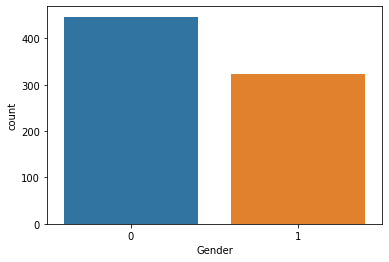

In [ ]:
print("The gender distribution as follow with 0 as woman label")
sns.countplot(label_list['Gender'])

The minimum-maximum age is 5 and 50 with the follow distribution


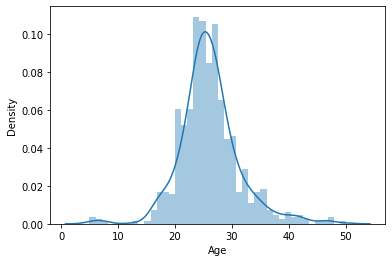

In [ ]:
print("The minimum-maximum age is {} and {} with the follow distribution".format(label_list['Age'].min(), label_list['Age'].max()))
sns.distplot(label_list['Age'])

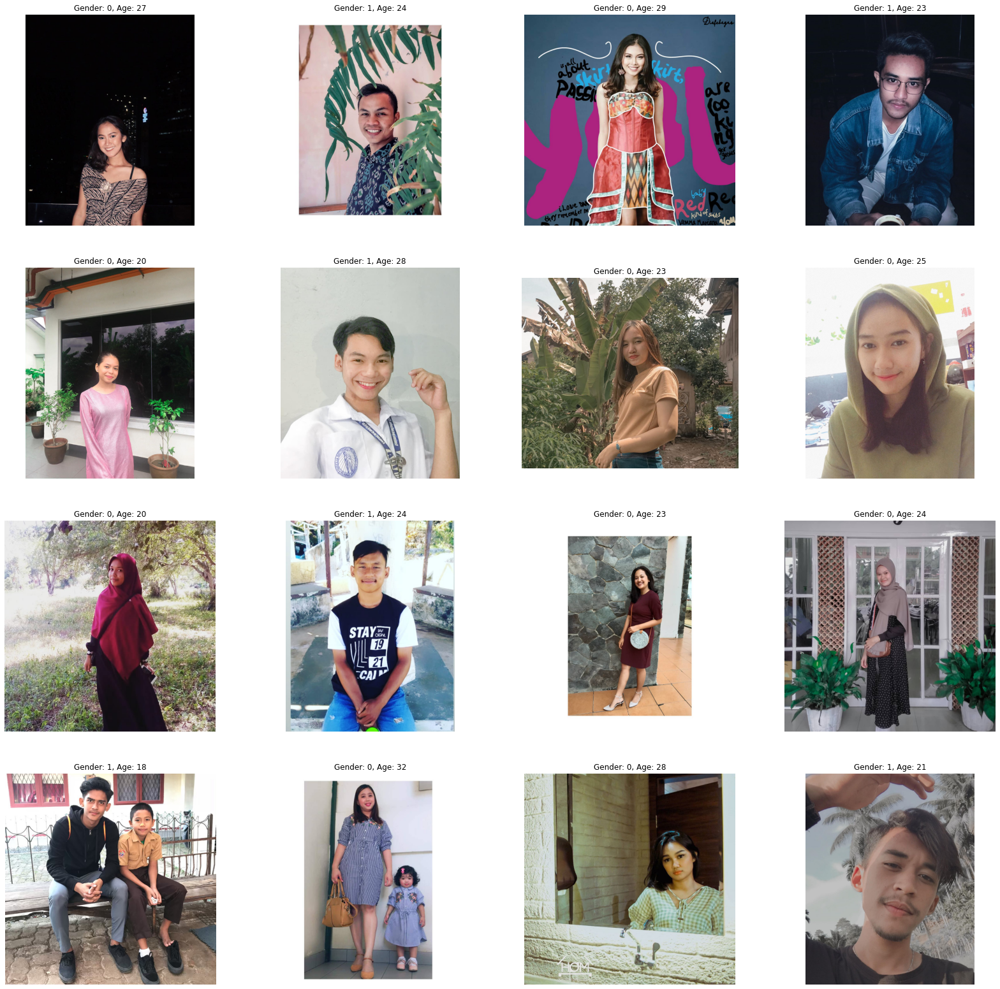

In [ ]:
# Display grid of some example images
## Set the grid size
plt.figure(figsize=(28, 28))
## Set the first 16 images as sample
sample = label_list.iloc[0:16]

## Iterate over sample
for index, _, fold_path, gender, age in sample.itertuples():
  plt.subplot(4, 4, index+1)
  ## Get the first image sample for each selected folder
  file = os.path.join(fold_path, os.listdir(fold_path)[0])
  ## Read each image file
  img = mpimg.imread(file)
  ## Convert image to ndarray
  img = np.array(img)
  ## Display images and its labels
  plt.imshow(img)
  plt.title(f"Gender: {gender}, Age: {age}")
  plt.axis('off')

## Deepface
Deepface is a lightweight face recognition and facial attribute analysis framework for Python. The Deepface framework is used for face detection from images in dataset.
* The official documentation [here](https://pypi.org/project/deepface/).



In [ ]:
# Install the framework
!pip install deepface

# Import appropriate class(es)
from deepface import DeepFace

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Create a helper-function to preprocess the images
def preprocess_deepface(SOURCE_ROOT, DESTINATION_ROOT):
  """
  Params:
          SOURCE_ROOT : source root directory for folders that contains images
          DESTINATION_ROOT : destination root directory that save result file into
  """ 
  ## Ensure the destination root directory is exist
  if not os.path.exists(DESTINATION_ROOT):
    ## Create if doesn't exist
    os.makedirs(DESTINATION_ROOT)
  ## Get the folder list for easier iteration
  folder_list = sorted([dirs for root, dirs, files in os.walk(SOURCE_ROOT)][0])
  ## Iterate over the prior list index
  for index in tqdm(range(len(folder_list))):
    ## Get path for each foler
    folder_path = os.path.join(SOURCE_ROOT, str(folder_list[index]))
    ## Iterate over the images inside folder
    for img in os.listdir(folder_path):
      ## Ensure that the images are .jpg format file
      if not img.endswith('.jpg'):
        ## Skip the file if not .jpg format
        continue
      ## Set the deepface tools
      detected_face = DeepFace.detectFace(
          img_path=os.path.join(folder_path, img),
          detector_backend = 'ssd',
          target_size = (224, 224), 
          enforce_detection=False
      )
      ## Copy the results into folder for each label
      if not os.path.exists(os.path.join(DESTINATION_ROOT, str(folder_list[index]))):
        os.makedirs(os.path.join(DESTINATION_ROOT, str(folder_list[index])))
        mpimg.imsave(DESTINATION_ROOT + "/" + str(folder_list[index]) + "/" + img, 
                     detected_face)
      else:
        mpimg.imsave(DESTINATION_ROOT + "/" + str(folder_list[index]) + "/" + img, 
                     detected_face)

In [ ]:
# Define root directories, both source and destination
source_root = './Training'
destination_root = '/tmp/data/FaceCropped'

# Empty destination directory to prevent FileExistsError when run several times
if os.path.exists(destination_root):
  shutil.rmtree(destination_root)

# Execute the defined function
preprocess_deepface(source_root, destination_root)

  0%|          | 0/770 [00:00<?, ?it/s]

deploy.prototxt will be downloaded...


Downloading...
From: https://github.com/opencv/opencv/raw/3.4.0/samples/dnn/face_detector/deploy.prototxt
To: /root/.deepface/weights/deploy.prototxt

28.1kB [00:00, 25.2MB/s]                   


res10_300x300_ssd_iter_140000.caffemodel will be downloaded...


Downloading...
From: https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
To: /root/.deepface/weights/res10_300x300_ssd_iter_140000.caffemodel

100%|██████████| 10.7M/10.7M [00:00<00:00, 139MB/s]
100%|██████████| 770/770 [06:38<00:00,  1.93it/s]


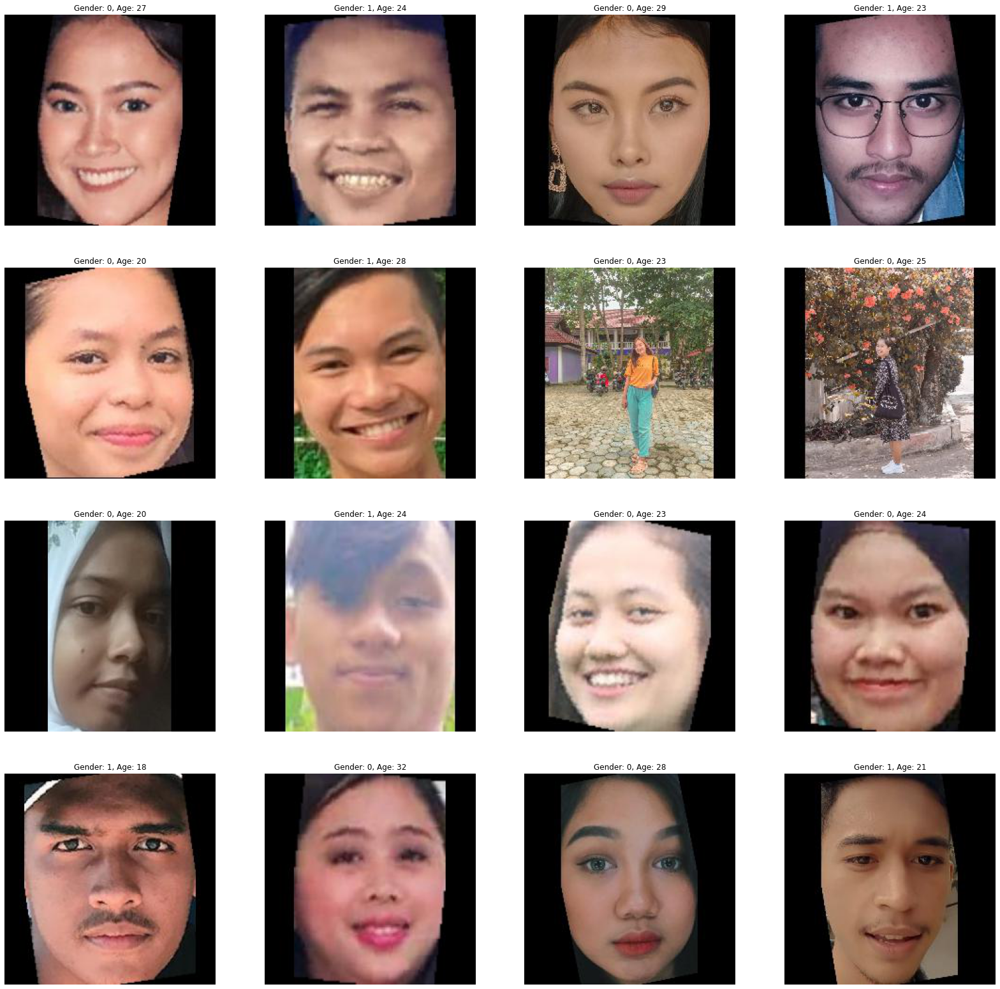

In [ ]:
# Create a new dataframe for the cropped one
csv_path = './train.csv'
cropped_label_list = pd.read_csv(csv_path)
cropped_label_list.columns = ['Folder Number', 'Gender', 'Age']

# Add the folder paths into dataframe
cropped_dir = '/tmp/data/FaceCropped'
cropped_folder_path = []
for index, row in label_list.iterrows():
  cropped_folder_path.append(os.path.join(cropped_dir, str(row['Folder Number'])))
cropped_label_list.insert(loc=1, column='Folder Path', value=cropped_folder_path)

# Display grid of some example cropped images
plt.figure(figsize=(28, 28))
crop_sample = cropped_label_list.iloc[0:16]
for index, _, fold_path, gender, age in crop_sample.itertuples():
    plt.subplot(4, 4, index+1)
    ## Get the first image sample for each selected folder
    file = os.path.join(fold_path, os.listdir(fold_path)[0])
    img = mpimg.imread(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title(f"Gender: {gender}, Age: {age}")
    plt.axis('off')

## Appropriate Dataset Structure
This step is required to construct a structure that applicable for Data Generator 



In [ ]:
# Create a helper-function to moving the images and split for Gender and Age dataset structure
def move_image(SOURCE_ROOT, DATAFRAME, DESTINATION_MAIN, DESTINATION_GENDER, DESTINATION_AGE):
  """
  Params:
          SOURCE_ROOT : source root directory for folders that contains images
          DATAFRAME : dataframe that contains each folder path
          DESTINATION_MAIN : destination directory without folder boundaries
          DESTINATION_GENDER : destination root directory for Gender dataset structure
          DESTINATION_AGE : destination root directory for Age dataset structure
  Returns:
          MAIN_DATAFRAME : dataframe for DESTINATION_MAIN
  """ 
  ## Create the destination directories
  for dir in [DESTINATION_MAIN, DESTINATION_GENDER, DESTINATION_AGE]:
    if not os.path.exists(dir):
      os.makedirs(dir)
  ## Copy the images into appropriate folder for each label, both Gender and Age dataset
  gender_list = []
  age_list = []
  for _, row in DATAFRAME.iterrows():
    gender_list.append(row['Gender']) 
    age_list.append(row['Age'])
  folder_list = [dirs for root, dirs, files in os.walk(SOURCE_ROOT)][0]
  folder_list_sorted = sorted(int(dir) for dir in folder_list)
  imgId_return = []
  gender_return = []
  age_return = []
  for index in range(len(folder_list)):
    folder_path = os.path.join(SOURCE_ROOT, str(folder_list_sorted[index]))
    for img in os.listdir(folder_path):
      imgId_return.append(img)
      gender_return.append(str(gender_list[index]))
      age_return.append(int(age_list[index]))
      if not os.path.exists(os.path.join(DESTINATION_GENDER, str(gender_list[index]))):
        os.makedirs(os.path.join(DESTINATION_GENDER, str(gender_list[index])))
        shutil.copy(os.path.join(folder_path, img),
                    os.path.join(DESTINATION_GENDER, str(gender_list[index])))
      else:
        shutil.copy(os.path.join(folder_path, img),
                    os.path.join(DESTINATION_GENDER, str(gender_list[index])))
      if not os.path.exists(os.path.join(DESTINATION_AGE, str(age_list[index]))):
        os.makedirs(os.path.join(DESTINATION_AGE, str(age_list[index])))
        shutil.copy(os.path.join(folder_path, img),
                    os.path.join(DESTINATION_AGE, str(age_list[index])))
      else:
        shutil.copy(os.path.join(folder_path, img),
                    os.path.join(DESTINATION_AGE, str(age_list[index])))
      ## Copy the images into DESTINATION_MAIN
      shutil.copy(os.path.join(folder_path, img), str(DESTINATION_MAIN))
  ## Create the return dataframe
  df_return = pd.DataFrame()
  df_return['Image ID'], df_return['Gender'], df_return['Age'] = imgId_return, gender_return, age_return
  return df_return  

In [ ]:
# Define root directories, both source and destination
cropped_root = '/tmp/data/FaceCropped'
train_dir = '/tmp/data/Training Data'
dest_main = '/tmp/data/All Images'

# Empty destination directory to prevent FileExistsError when run several times
if os.path.exists(train_dir):
  shutil.rmtree(train_dir)

# Create directories for gender and age training data
train_gender_dir = os.path.join(train_dir, 'Training Gender Data')
train_age_dir = os.path.join(train_dir, 'Training Age Data')

# Execute the defined function
df_imagelist = move_image(cropped_root, cropped_label_list, dest_main, train_gender_dir, train_age_dir)

# **Exploratory Data Analysis**

In [ ]:
# Construct a function to display some sample images in each label
def display_sample(data_dir, num_sample):
  class_list = sorted([dirs for root, dirs, files in os.walk(data_dir)][0])
  for each_class in class_list:
    class_dir = os.path.join(data_dir, each_class)
    plt.figure(figsize=(100/num_sample, 4))
    print("\nLabel: {}".format(each_class))
    for index, image_path in enumerate(os.listdir(class_dir)[:num_sample]):
        ax = plt.subplot(1, num_sample, index+1)
        image = mpimg.imread(os.path.join(class_dir, image_path))
        ax.grid()
        plt.imshow(image)
    plt.show()


Label: 0


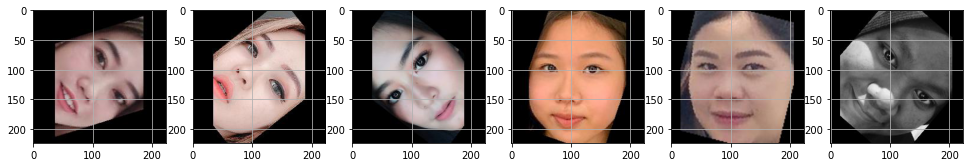


Label: 1


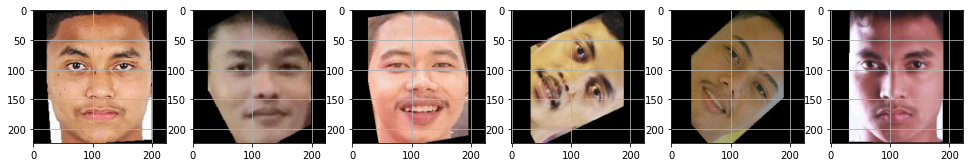

In [ ]:
# Execute display_sample function for Gender Training Data
display_sample(train_gender_dir, num_sample=6)


Label: 13


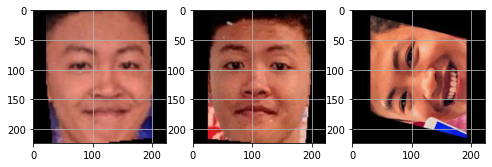


Label: 15


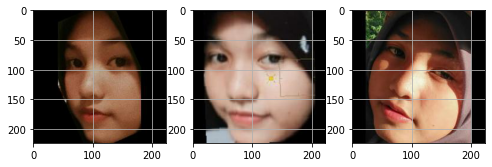


Label: 16


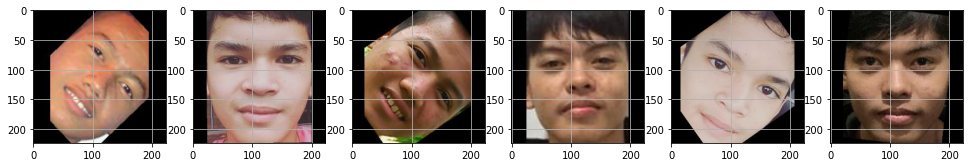


Label: 17


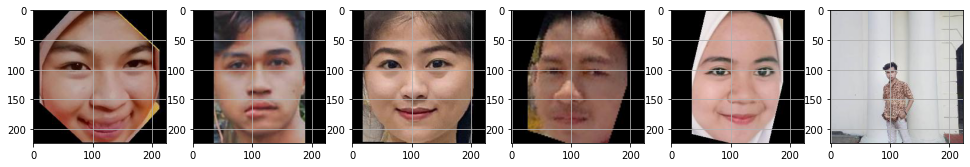


Label: 18


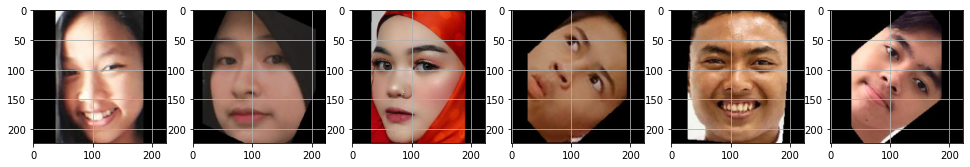


Label: 19


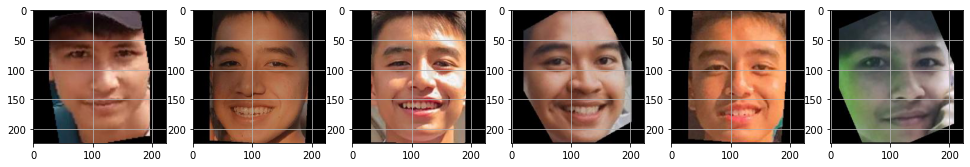


Label: 20


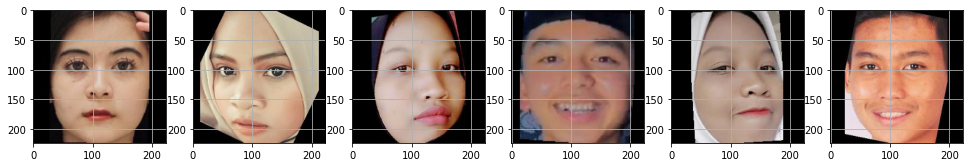


Label: 21


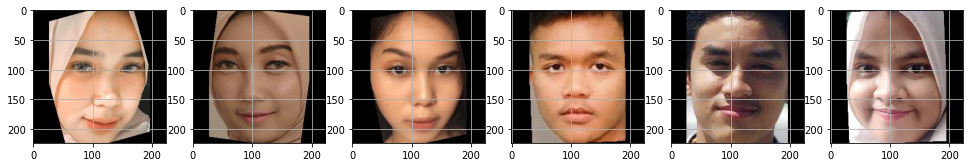


Label: 22


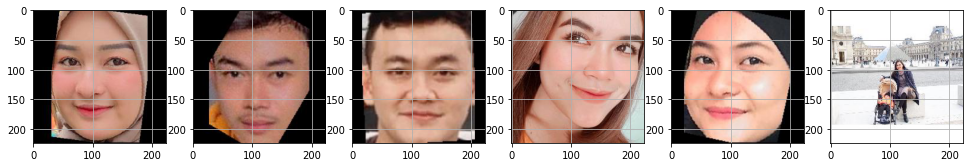


Label: 23


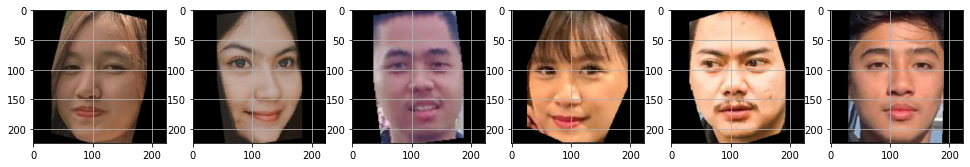


Label: 24


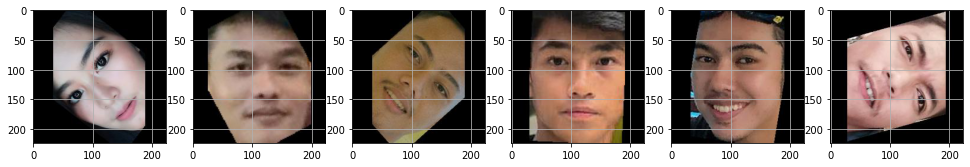


Label: 25


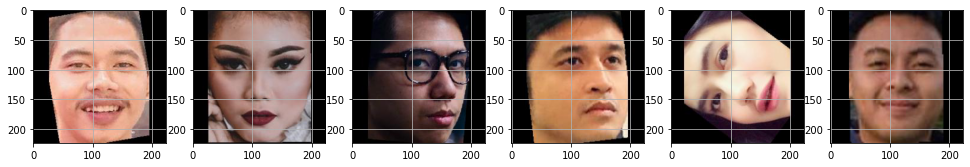


Label: 26


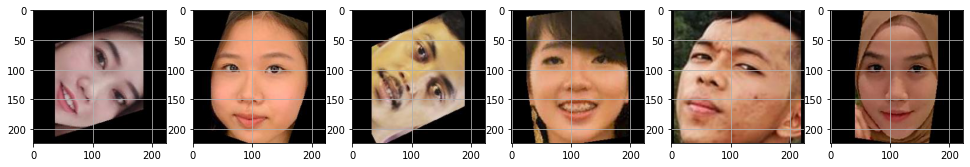


Label: 27


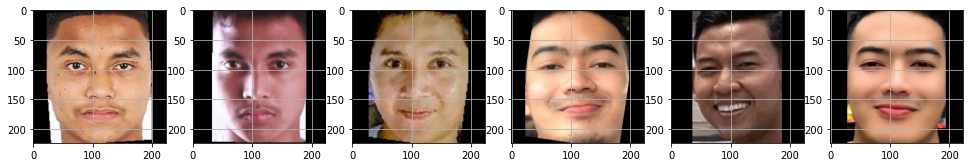


Label: 28


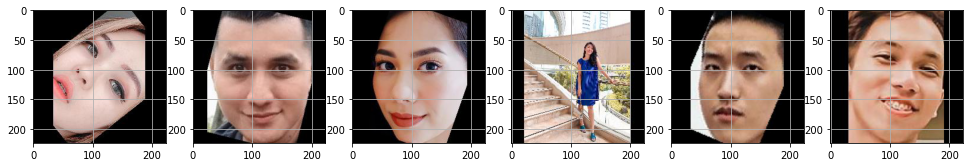


Label: 29


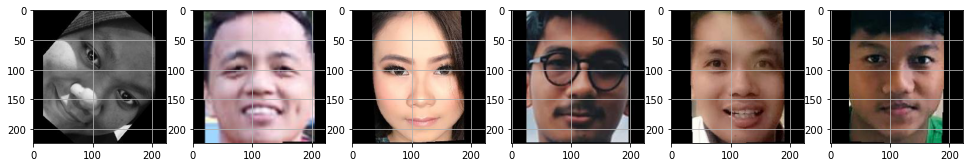


Label: 30


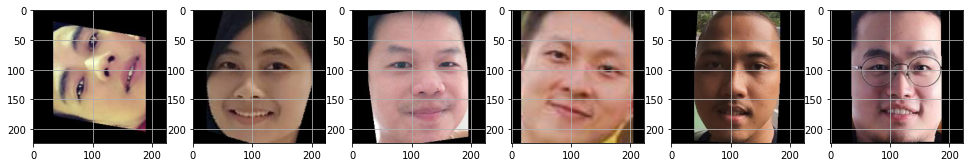


Label: 31


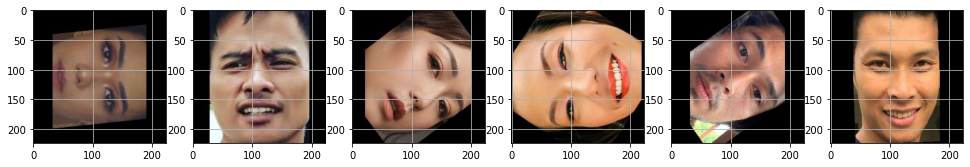


Label: 32


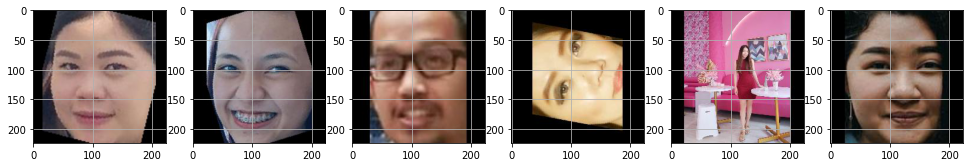


Label: 33


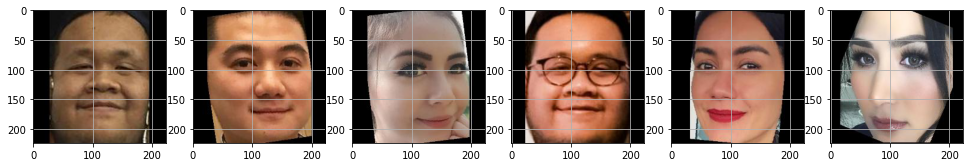


Label: 34


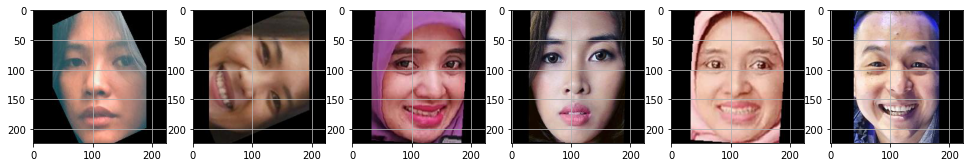


Label: 35


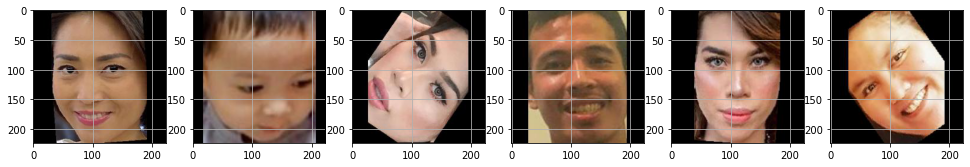


Label: 36


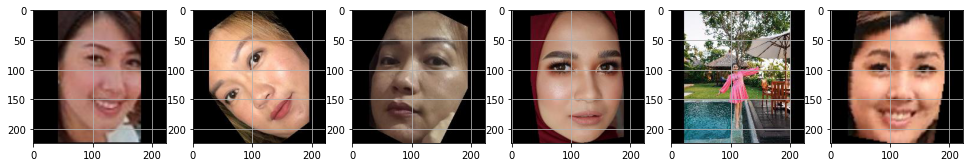


Label: 37


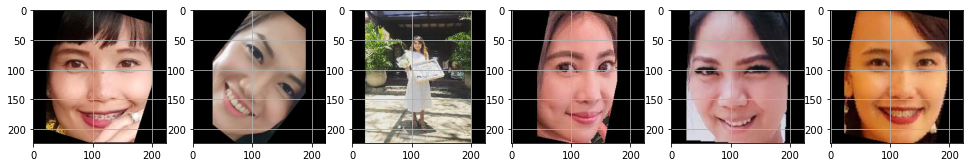


Label: 38


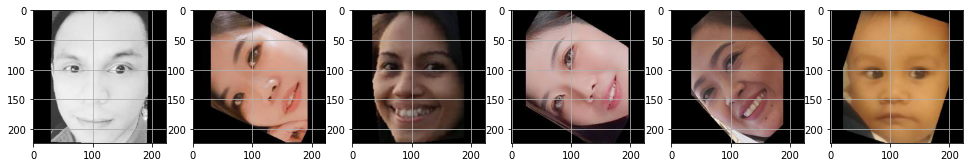


Label: 39


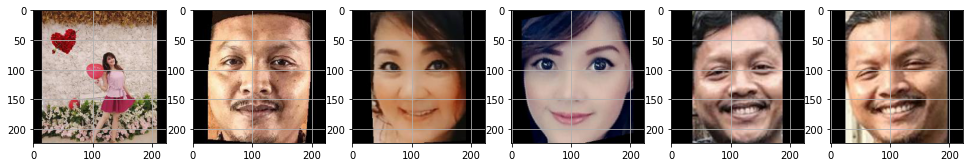


Label: 40


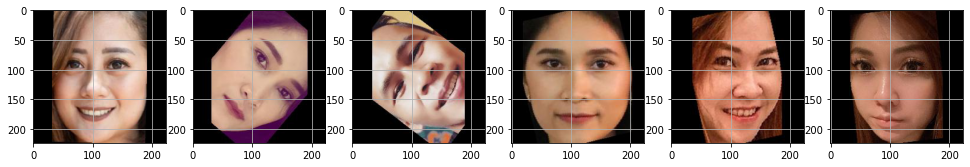


Label: 41


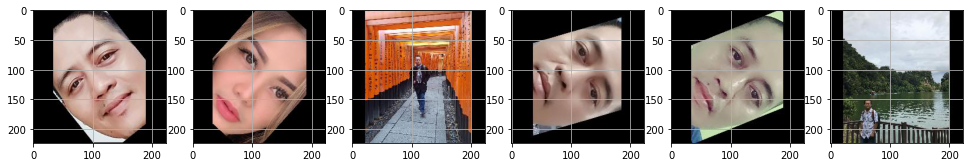


Label: 42


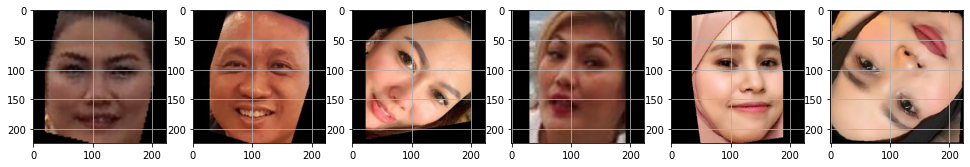


Label: 43


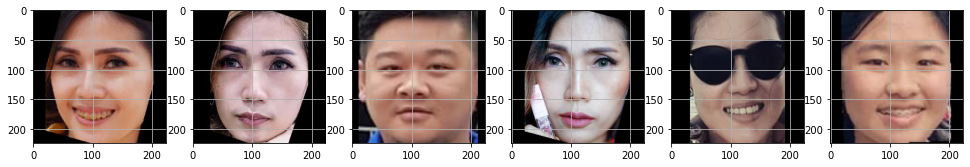


Label: 45


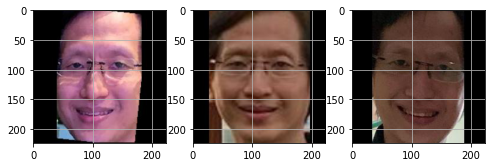


Label: 46


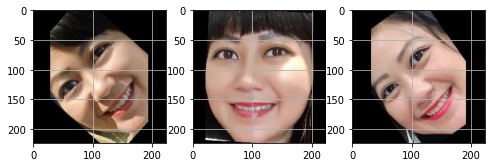


Label: 47


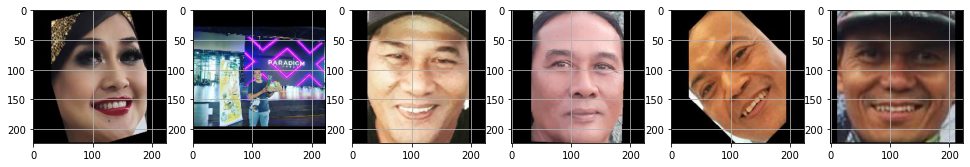


Label: 5


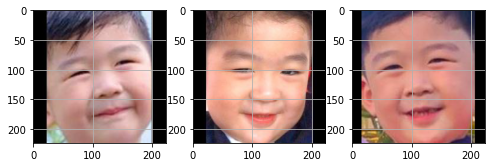


Label: 50


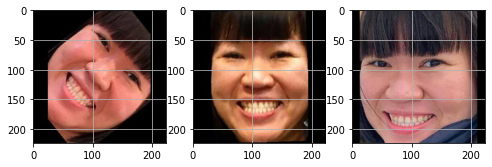


Label: 6


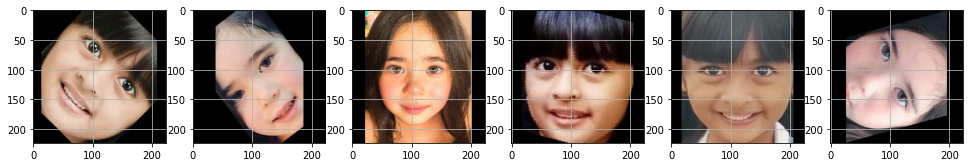


Label: 7


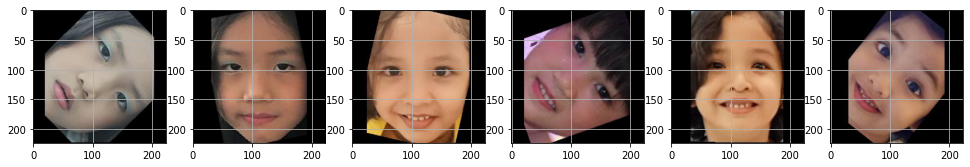


Label: 8


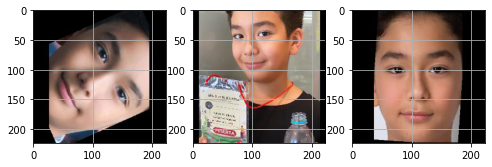

In [ ]:
# Execute display_sample function for Age Training Data
display_sample(train_age_dir, num_sample=6)

# Additional Dataset

In [ ]:
# Set Kaggle API
## Installation
! pip install kaggle

## Upload Kaggle API token (.json format) from user's profile 'Create API Token'
files.upload() ### Upload files button appears for import the .json file from local 

## Create a folder for specific Kaggle API location
! mkdir ~/.kaggle

## Copy the uploaded API token to the created folder
! cp kaggle.json ~/.kaggle/

## Modify file permission and ensure user's credential security
! chmod 600 ~/.kaggle/kaggle.json 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Saving kaggle.json to kaggle.json


In [ ]:
# Create a helper function to unzip file(s)
def unzip(zipfile_name_list):
  """
  Params:
          zipfile_name_list: List contains zipfile name without .zip extensions
  """
  ## Iterate over passed list
  for file in zipfile_name_list:
    ## Merge zipfile name with .zip extension
    file_zip = str(file) + '.zip'
    ## Try open zipfile with read 'r' mode
    try:
      zip_ref = zipfile.ZipFile(file_zip, 'r')
    except:
      print("Something went wrong when read to the unzip file")
    ## Extract readed zipfile by pass the destination path
    zip_ref.extractall('./' + file + '/')
    ## Close read mode
    zip_ref.close()

# Create a function to download and unzip Kaggle dataset by passed its webpage address link
def download_and_unzip_dataset(*dataset_link):
  """
  Params:
          *dataset_link: Kaggle dataset link(s) separate with commas and enclosed by string
  """
  ## Create empty list to collect zipfile name
  zipfile_name = [] 
  ## Iterate over passed Kaggle dataset link/address
  for link in dataset_link:
    ## Split address by forward slash
    slash_split = str(link).split('/')
    ## Set conditions to provide datasets download from either Kaggle regular datasets or competitions webpage
    if slash_split[-3] != 'datasets' and slash_split[-3] != 'competitions':
      ## Raise exception error if addresses are not as expected Kaggle webpage address format
      raise Exception('Link(s) format are not as expected')
    ## Set conditions for Kaggle regular datasets download
    if slash_split[-3] == 'datasets':
      ## Construct a formatted dataset name
      dataset_name = slash_split[-2] + '/' + slash_split[-1]
      ## Do bash command to download datasets
      ! kaggle datasets download $dataset_name
    ## Set conditions for Kaggle competitions datasets download
    if slash_split[-3] == 'competitions':
      ## Construct a formatted dataset name
      dataset_name = slash_split[-1]
      ## Do bash command to download datasets
      ! kaggle competitions download -c $dataset_name
    ## Append last split space as zipfile name
    zipfile_name.append(slash_split[-1])
  ## Execute the created helper function to unzip downloaded file(s)
  unzip(zipfile_name)

In [ ]:
# Download the appropriate dataset(s) by pass its Kaggle webpage link to the created function 
## Download and unzip the UTKFace dataset from Kaggle
download_and_unzip_dataset('https://www.kaggle.com/datasets/jangedoo/utkface-new')
## Delete unnecessary directories
! rm -rf './utkface-new/crop_part1'
! rm -rf './utkface-new/utkface_aligned_cropped'
! rm -rf './sample_data'

 97% 321M/331M [00:08<00:00, 26.9MB/s]
100% 331M/331M [00:08<00:00, 39.0MB/s]


In [ ]:
# Set source base directory
UTK_BASE_DIR = './utkface-new/UTKFace'

# Create Dataframe based on file name parse label
utk_imageIDs = []
utk_genderLabels = []
utk_ageLabels = []
except_age = [0, 1, 2, 3, 4, 5, 23, 24, 25, 26, 27, 28]

for filename in os.listdir(UTK_BASE_DIR):
  utk_genderLabel = filename.split("_")[1]
  utk_ageLabel = filename.split("_")[0]
  if utk_genderLabel == '1':
    utk_genderLabel = '0'
  else:
    utk_genderLabel = '1'
  if int(utk_ageLabel) in except_age:
    continue
  utk_imageIDs.append(filename)
  utk_genderLabels.append(str(utk_genderLabel))
  utk_ageLabels.append(float(utk_ageLabel))

utk_genderLabels = np.array(utk_genderLabels)
utk_ageLabels = np.array(utk_ageLabels)

# Create a dataframe that contains image path and its labels
utk_df = pd.DataFrame()
utk_df['Image ID'], utk_df['Gender'], utk_df['Age'] = utk_imageIDs, utk_genderLabels, utk_ageLabels

# Copy the images
for image in os.listdir(UTK_BASE_DIR):
  shutil.copy(os.path.join(UTK_BASE_DIR, image), '/tmp/data/All Images')

In [ ]:
# Merge two dataframes
df_merge = pd.concat([df_imagelist, utk_df])
print("\nThere are {} images with the first 10 labels as follow".format(len(df_merge['Image ID'])))
df_merge.head(10)


There are 17906 images with the first 10 labels as follow


,Image ID,Gender,Age
0,1_3.jpg,0,27.0
1,1_1.jpg,0,27.0
2,1_2.jpg,0,27.0
3,2_1.jpg,1,24.0
4,2_3.jpg,1,24.0
5,2_2.jpg,1,24.0
6,3_1.jpg,0,29.0
7,3_3.jpg,0,29.0
8,3_2.jpg,0,29.0
9,4_2.jpg,1,23.0


# **Gender Model Prediction**

## Image Augmentation & Data Generator

In [ ]:
def gender_train_val_generator(DATAFRAME, XCOL, YCOL, DIRECTORY, TARGET_SIZE, BATCH_SIZE):
  """
  Params:
        DATA_DIR: Data directory that contains classes directory
        TARGET_SIZE: Tuple contains target size height and width
        BATCH_SIZE: Desired batch size
  Returns:
        train_genetator: Image data generator for train split
        validation_generator: Image data generator for validation split
  """ 
  ## Instantiate the ImageDataGenerator class with images augmentation
  train_datagen = ImageDataGenerator(rescale=1./255,
                                     height_shift_range=.1,
                                     width_shift_range=.1,
                                     shear_range=.2,
                                     zoom_range=.05,
                                     horizontal_flip=True,
                                     validation_split=.2)

  ## Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_dataframe(dataframe=DATAFRAME,
                                                      x_col=XCOL, y_col=YCOL,
                                                      directory=DIRECTORY,
                                                      batch_size=BATCH_SIZE,
                                                      class_mode='binary',
                                                      has_ext=True,
                                                      target_size=TARGET_SIZE,
                                                      shuffle=False,
                                                      seed=42,
                                                      subset='training')

  # Instantiate the ImageDataGenerator class
  validation_datagen = ImageDataGenerator(rescale=1./255,
                                          validation_split=.2)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_dataframe(dataframe=DATAFRAME,
                                                                x_col=XCOL, y_col=YCOL,
                                                                directory=DIRECTORY,
                                                                batch_size=BATCH_SIZE,
                                                                class_mode='binary',
                                                                has_ext=True,
                                                                target_size=TARGET_SIZE,
                                                                shuffle=False,
                                                                seed=42,
                                                                subset='validation')
  return train_generator, validation_generator

In [ ]:
# Set batch size and target image size
batch_size = 32
target_size = (224, 224)

# Set the dataframe and its appropriate columns
dataframe = df_merge
xcol = 'Image ID'
ycol = 'Gender'

# Set source base directory
sc_base_dir = '/tmp/data/All Images'

# Get train and validation data generator
gender_train_generator, gender_validation_generator = gender_train_val_generator(
    dataframe, xcol, ycol,
    sc_base_dir,
    target_size,
    batch_size)

Found 14325 validated image filenames belonging to 2 classes.
Found 3581 validated image filenames belonging to 2 classes.


## Model Architecture

In [ ]:
# Get the pre-trained model
def create_pre_trained_model(WEIGHTS, TARGET_SIZE):
  """
  Params:
        WEIGHTS: Choosen weights from pre trained model
        TARGET_SIZE: Tuple contains target size height and width   
  Returns:
        pre_trained_model: Imported pre trained model
  """ 
  ## Import Pre-Trained Model
  pre_trained_model = tf.keras.applications.mobilenet_v2.MobileNetV2(
      input_shape = (TARGET_SIZE[0], TARGET_SIZE[1], 3),
      include_top = False, 
      weights = WEIGHTS)
  
  return pre_trained_model

In [ ]:
# Execute create_pre_trained_model function
## Use downloaded weights
pre_trained_model = create_pre_trained_model('imagenet', 
                                             target_size)

## Print the model summary
pre_trained_model.summary()

9420800/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                

In [ ]:
# Create a function to pipeline imported model
## Set the desired layer from pre-trained model as a input for self-model
def output_of_last_layer(PRE_TRAINED_MODEL):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model  
  Returns:
        last_output: The desired layer as a input for self-model
  """ 
  last_desired_layer = PRE_TRAINED_MODEL.get_layer('out_relu')
  last_output = last_desired_layer.output

  return last_output

In [ ]:
# Execute the prior function
last_output = output_of_last_layer(pre_trained_model)

In [ ]:
# Create Final Model
def create_gender_model(PRE_TRAINED_MODEL, LAST_OUTPUT):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model 
        LAST_OUTPUT: The desired layer as a input for self-model  
  Returns:
        model: Created model
  """ 
  # Flatten the output layer to 1 dimension
  x = tf.keras.layers.Flatten()(LAST_OUTPUT)
  # Add dropout rate
  x = tf.keras.layers.Dropout(.8)(x)
  # Add a output layer for classification
  x = tf.keras.layers.Dense(1, activation='sigmoid', name='Predict-Gender')(x) 

  # Create the complete model by using the Model class
  model = tf.keras.Model(inputs=PRE_TRAINED_MODEL.input, outputs=x)

  # Fine Tuning
  NUM_LAYERS = 10 #@param {type:"slider", min:1, max:50, step:1}
  do_fine_tuning = False #@param {type:"boolean"}

  if do_fine_tuning:
      #optimizer = tf.keras.optimizers.SGD(lr=5e-3, momentum=0.9)
      optimizer = tf.keras.optimizers.Adam(learning_rate=3e-4)
      for layer in model.layers[-NUM_LAYERS:]:
          layer.trainable = True

      # Make all the layers in the pre-trained model trainable
      for layer in pre_trained_model.layers:
          layer.trainable = True
  else:
      optimizer = tf.keras.optimizers.Adam(learning_rate=3e-4)
      # Make all the layers in the pre-trained model non-trainable
      for layer in pre_trained_model.layers:
          layer.trainable = False

  model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=optimizer,
                metrics=['accuracy'])

  return model

In [ ]:
# Get the model architecture
gender_model = create_gender_model(pre_trained_model, last_output)

# Get model summary
gender_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

## Train the Model

In [ ]:
# Callbacks schedule
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    # Check
    if logs.get('accuracy') > .98 and logs.get('val_accuracy') > .95:

      # Stop if threshold is met
      print("\nThe thresholds are met so stop training!")
      self.model.stop_training = True

    # Get learning rate callbacks
    #lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))

# Instantiate class
callbacks = myCallback()

# Model checkpoint
model_checkp = tf.keras.callbacks.ModelCheckpoint('gender_model_checkpoint.h5', monitor='val_accuracy',
                                                  mode='max', verbose=1, save_best_only=True)

In [ ]:
# Train the model
gender_history = gender_model.fit(gender_train_generator,
                                  epochs=5,
                                  steps_per_epoch=int(gender_train_generator.samples/batch_size),
                                  verbose=1,
                                  validation_data=gender_validation_generator,
                                  validation_steps=int(gender_validation_generator.samples/batch_size),
                                  callbacks=[callbacks, model_checkp])

Epoch 1/5
447/447 [==============================] - ETA: 0s - loss: 0.9268 - accuracy: 0.7597
Epoch 1: val_accuracy improved from -inf to 0.72297, saving model to gender_model_checkpoint.h5
447/447 [==============================] - 188s 406ms/step - loss: 0.9268 - accuracy: 0.7597 - val_loss: 0.9882 - val_accuracy: 0.7230
Epoch 2/5
447/447 [==============================] - ETA: 0s - loss: 0.7953 - accuracy: 0.8043
Epoch 2: val_accuracy improved from 0.72297 to 0.77984, saving model to gender_model_checkpoint.h5
447/447 [==============================] - 159s 355ms/step - loss: 0.7953 - accuracy: 0.8043 - val_loss: 0.7090 - val_accuracy: 0.7798
Epoch 3/5
447/447 [==============================] - ETA: 0s - loss: 0.8250 - accuracy: 0.8116
Epoch 3: val_accuracy improved from 0.77984 to 0.78181, saving model to gender_model_checkpoint.h5
447/447 [==============================] - 158s 354ms/step - loss: 0.8250 - accuracy: 0.8116 - val_loss: 0.8055 - val_accuracy: 0.7818
Epoch 4/5
447/44

## Result Plot

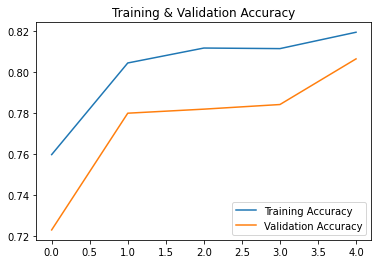

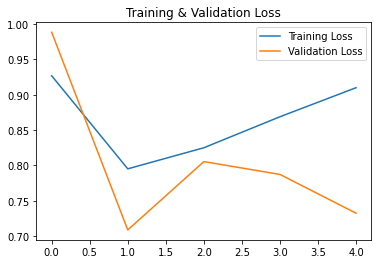

In [ ]:
# Plot the train result
## Get accuracy and val_accuracy histories
acc = gender_history.history['accuracy']
val_acc = gender_history.history['val_accuracy']

## Get accuracy and val_accuracy losses
loss = gender_history.history['loss']
val_loss = gender_history.history['val_loss']

epochs = range(len(acc))

## Plot accuracies result
plt.plot(epochs, acc, label = 'Training Accuracy')
plt.plot(epochs, val_acc, label = 'Validation Accuracy')
plt.title('Training & Validation Accuracy')

plt.legend()
plt.show() 

plt.figure()

## Plot losses result
plt.plot(epochs, loss, label ='Training Loss')
plt.plot(epochs, val_loss, label = 'Validation Loss')
plt.title('Training & Validation Loss')

plt.legend()
plt.show()  

In [ ]:
gender_train_score = gender_model.evaluate(gender_train_generator)
gender_validation_score = gender_model.evaluate(gender_validation_generator)

print('Overall Train Accuracy : ', gender_train_score[1])
print('Overall Validation Accuracy: ', gender_validation_score[1])

112/112 [==============================] - 8s 70ms/step - loss: 0.7291 - accuracy: 0.8073
Overall Train Accuracy :  0.8917277455329895
Overall Validation Accuracy:  0.8073163628578186


## Save & Test Model

In [ ]:
# Save the trained model to .h5 format file
model_path = './gender_model'
print("[INFO] saving model... path: %s"%(model_path+".h5"))
gender_model.save(model_path+".h5")

[INFO] saving model... path: ./gender_model.h5


In [ ]:
# Convert to .json format
## Install required library
!pip install tensorflowjs

import os
## Path to .json directory
export_json_path = os.path.join('./', 'json_format')

## Ensure the temporary file
if os.path.isdir(export_json_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_json_path}

## Convert command
!tensorflowjs_converter --input_format=keras {model_path} {export_json_path}

# Wrap all into a zip file
!zip -r './json_gendermodel.zip' {export_json_path}

In [ ]:
# Load the model
from keras.models import load_model
model_path = "./gender_model.h5"
trained_gender_model = load_model(model_path)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2
import numpy as np
#path of the directory where you want to save your model
frozen_out_path = ''
# name of the .pb file
frozen_graph_filename = 'gender_model'
model = trained_gender_model
# Convert Keras model to ConcreteFunction
full_model = tf.function(lambda x: model(x))
full_model = full_model.get_concrete_function(
    tf.TensorSpec(model.inputs[0].shape, model.inputs[0].dtype))
# Get frozen ConcreteFunction
frozen_func = convert_variables_to_constants_v2(full_model)
graph_def = frozen_func.graph.as_graph_def()
# Remove NoOp nodes
for i in reversed(range(len(graph_def.node))):
    if graph_def.node[i].op == 'NoOp':
        del graph_def.node[i]

for node in graph_def.node:
    for i in reversed(range(len(node.input))):
        if node.input[i][0] == '^':
            del node.input[i]
# Save frozen graph to disk
tf.io.write_graph(graph_or_graph_def=graph_def,
                  logdir=frozen_out_path,
                  name=f"{frozen_graph_filename}.pb",
                  as_text=False)

'gender_model.pb'

In [ ]:
import tensorflow as tf

pb_file = './gender_model.pb'
graph_def = tf.compat.v1.GraphDef()

with tf.io.gfile.GFile(pb_file, 'rb') as f:
  graph_def.ParseFromString(f.read())

# Delete weights
for i in reversed(range(len(graph_def.node))):
    if graph_def.node[i].op == 'Const':
        del graph_def.node[i]

graph_def.library.Clear()

tf.compat.v1.train.write_graph(graph_def, "", 'gender_model.pbtxt', as_text=True)

'gender_model.pbtxt'

In [ ]:
# Download CascadeClassifier from GitHub
! wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

--2022-07-13 07:47:55--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml.1’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.05s   

2022-07-13 07:47:55 (19.2 MB/s) - ‘haarcascade_frontalface_default.xml.1’ saved [930127/930127]



In [ ]:
# Process and predict function with CascadeClassifier class help to detecting face in a image
def process_and_predict(img_path):
  face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
  pic = cv2.imread(img_path)
  gray = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)
  age_ = []
  gender_ = []
  for (x,y,w,h) in faces:
    img = gray[y-50:y+40+h, x-10:x+10+w]
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    img = cv2.resize(img,(224, 224))
    img = np.array(img).reshape(-1,224,224,3)/255.
    predict = trained_gender_model.predict(img)
    if predict[0] > 0.5:
      gend = 'Man'
      col = (255, 0, 0)
    else:
      gend = 'Woman'
      col = (203, 12, 255)
    cv2.rectangle(pic, (x,y),(x+w,y+h),(0,225,0), 4)
    cv2.putText(pic, "Gender : "  + str(gend), (x, y), cv2.FONT_HERSHEY_SIMPLEX, w*0.005, col, 4)
  pic1 = cv2.cvtColor(pic,cv2.COLOR_BGR2RGB)
  plt.imshow(pic1)
  plt.show() 

Lionel Messi 
Actual: Man


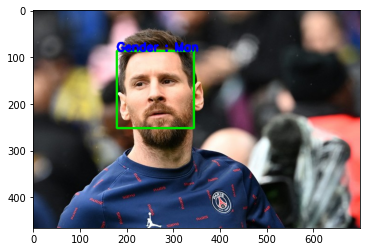

In [ ]:
print('Lionel Messi \nActual: Man')
process_and_predict('./messi.jpeg')

Kim Jisoo 
Actual: Woman


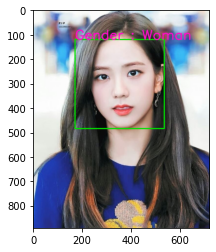

In [ ]:
print('Kim Jisoo \nActual: Woman')
process_and_predict('./jisoo.jpg')

Leonardo DiCaprio 
Actual: Man


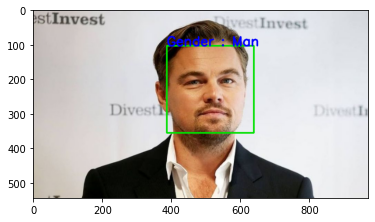

In [ ]:
print('Leonardo DiCaprio \nActual: Man')
process_and_predict('./dicaprio.jpg')

Mariah Carey 
Actual: Woman


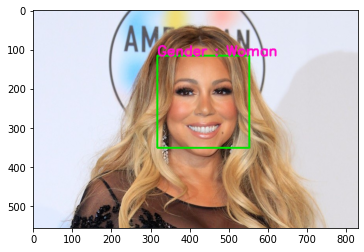

In [ ]:
print('Mariah Carey \nActual: Woman')
process_and_predict('./mariah.jpg')

Madonna 
Actual: Woman


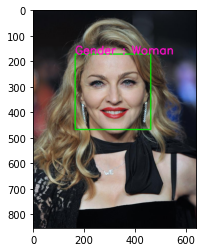

In [ ]:
print('Madonna \nActual: Woman')
process_and_predict('./madonna.jpg')

In [ ]:
# Code for real test through webcam
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

# Memulai streaming video dari webcam
video_stream()
# Label untuk video
label_html = 'Capturing...'
bbox = ''
count = 0 

while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # Mengkonvert JS response ke OpenCV Image
    img = js_to_image(js_reply["img"])
    
    # Membuat transparan overlay untuk bounding box
    bbox_array = np.zeros([512, 512, 4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
    faces = face_cascade.detectMultiScale(gray)

    faces_list = []
    preds = []

    for (x,y,w,h) in faces:
      #x, y, w, h = result['box']
      x1, y1 = x + w, y + h
      
      # Ekstrak ROI wajah, konversikan dari BGR ke pemesanan saluran RGB,
      # dan mengubah ukurannya menjadi 224x224, dan lalu pre-prosess
      face_crop = gray[y:y1, x:x1]
      face_crop = cv2.cvtColor(face_crop, cv2.COLOR_BGR2RGB)
      face_crop = cv2.resize(face_crop, (224, 224))
      face_crop = np.array(face_crop).reshape(-1, 224, 224, 3)/255.
    
      predict = trained_gender_model.predict(face_crop)

      # Processing the label
      if predict[0] > 0.5:
        gend = 'Man'
        col = (255, 0, 0)
      else:
        gend = 'Woman'
        col = (203, 12, 255)

      label = "Gender : "+ str(gend)

		  # Menampilkan hasil dengan label dan kotak dari frame
      bbox_array=cv2.putText(bbox_array, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, col, 4)
      bbox_array=cv2.rectangle(bbox_array, (x, y), (x1, y1), (0, 225, 0), 4)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255

    # Mengkonversi overlay bbox ke dalam bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
 
    # Mengupdate bbox ke pada frame selanjutnya untuk mendapat overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>

# **Age Model Prediction**

## Image Augmentation & Data Generator

In [ ]:
def age_train_val_generator(DATAFRAME, XCOL, YCOL, DIRECTORY, TARGET_SIZE, BATCH_SIZE):
  """
  Params:
        DATA_DIR: Data directory that contains classes directory
        TARGET_SIZE: Tuple contains target size height and width
        BATCH_SIZE: Desired batch size
  Returns:
        train_genetator: Image data generator for train split
        validation_generator: Image data generator for validation split
  """ 
  ## Instantiate the ImageDataGenerator class with images augmentation
  train_datagen = ImageDataGenerator(height_shift_range=.1,
                                     width_shift_range=.1,
                                     shear_range=.2,
                                     horizontal_flip=True,
                                     validation_split=.2)

  ## Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_dataframe(dataframe=DATAFRAME,
                                                      x_col=XCOL, y_col=YCOL,
                                                      directory=DIRECTORY,
                                                      batch_size=BATCH_SIZE,
                                                      class_mode='raw',
                                                      has_ext=True,
                                                      target_size=TARGET_SIZE,
                                                      shuffle=False,
                                                      seed=42,
                                                      subset='training')

  # Instantiate the ImageDataGenerator class
  validation_datagen = ImageDataGenerator(validation_split=.2)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_dataframe(dataframe=DATAFRAME,
                                                                x_col=XCOL, y_col=YCOL,
                                                                directory=DIRECTORY,
                                                                batch_size=BATCH_SIZE,
                                                                class_mode='raw',
                                                                has_ext=True,
                                                                target_size=TARGET_SIZE,
                                                                shuffle=False,
                                                                seed=42,
                                                                subset='validation')
  return train_generator, validation_generator

In [ ]:
# Set batch size and target image size
batch_size = 32
target_size = (224, 224)

# Set the dataframe and its appropriate columns
dataframe = df_merge
xcol = 'Image ID'
ycol = 'Age'

# Set source base directory
sc_base_dir = '/tmp/data/All Images'

# Get train and validation data generator
age_train_generator, age_validation_generator = age_train_val_generator(
    dataframe, xcol, ycol,
    sc_base_dir,
    target_size,
    batch_size)

Found 14325 validated image filenames.
Found 3581 validated image filenames.


## Model Architecture

In [ ]:
# Create a Model
def create_age_model(TARGET_SIZE):
  """
  Params:
        PRE_TRAINED_MODEL: Imported pre trained model 
        LAST_OUTPUT: The desired layer as a input for self-model  
  Returns:
        model: Created model
  """ 
  model = tf.keras.models.Sequential([
    tf.keras.applications.MobileNetV3Large(weights="imagenet",
                                include_top=False, 
                                input_tensor=tf.keras.layers.Input(shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3))),
    tf.keras.layers.Dropout(.8),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='relu')  
])
  model.layers[0].trainable = False

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=3e-4))

  return model

In [ ]:
# Get the model architecture
age_model = create_age_model(target_size)

# Get model summary
age_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 MobilenetV3large (Functiona  (None, 7, 7, 960)        2996352   
 l)                                                              
                                                                 
 dropout_1 (Dropout)         (None, 7, 7, 960)         0         
                                                                 
 flatten_1 (Flatten)         (None, 47040)             0         
                                                                 
 dense_1 (Dense)             (None, 1)                 47041     
                                                                 
Total params: 3,043,393
Trainable params: 47,041
Non-trainable params: 2,996,352
_________________________________________________________________


## Train the Model

In [ ]:
# Get some callback schedules
## Create simple early stopping
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)


## Model checkpoint
model_checkp = tf.keras.callbacks.ModelCheckpoint('age_model_checkpoint.h5', monitor='val_loss',
                                                  mode='min', verbose=1, save_best_only=True)

In [ ]:
# Train the model
age_history = age_model.fit(age_train_generator,
                            epochs=5,
                            steps_per_epoch=int(age_train_generator.samples/batch_size),
                            verbose=1,
                            validation_data=age_validation_generator,
                            validation_steps=int(age_validation_generator.samples/batch_size),
                            callbacks=[early_stop, model_checkp])

Epoch 1/5
447/447 [==============================] - ETA: 0s - loss: 282.7085
Epoch 1: val_loss improved from inf to 131.92909, saving model to age_model_checkpoint.h5
447/447 [==============================] - 175s 357ms/step - loss: 282.7085 - val_loss: 131.9291
Epoch 2/5
447/447 [==============================] - ETA: 0s - loss: 194.4476
Epoch 2: val_loss improved from 131.92909 to 123.56996, saving model to age_model_checkpoint.h5
447/447 [==============================] - 156s 349ms/step - loss: 194.4476 - val_loss: 123.5700
Epoch 3/5
447/447 [==============================] - ETA: 0s - loss: 186.2985
Epoch 3: val_loss did not improve from 123.56996
447/447 [==============================] - 156s 349ms/step - loss: 186.2985 - val_loss: 128.7777
Epoch 4/5
447/447 [==============================] - ETA: 0s - loss: 184.4987
Epoch 4: val_loss did not improve from 123.56996
447/447 [==============================] - 155s 348ms/step - loss: 184.4987 - val_loss: 130.0807
Epoch 5/5
447/44

## Result Plot

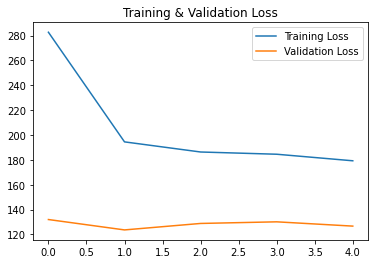

In [ ]:
# Plot the train result
## Get accuracy and val_accuracy losses
loss = age_history.history['loss']
val_loss = age_history.history['val_loss']

epochs = range(len(loss))

## Plot losses result
plt.plot(epochs, loss, label ='Training Loss')
plt.plot(epochs, val_loss, label = 'Validation Loss')
plt.title('Training & Validation Loss')

plt.legend()
plt.show()  

In [ ]:
age_train_score = age_model.evaluate(age_train_generator)
age_validation_score = age_model.evaluate(age_validation_generator)

112/112 [==============================] - 7s 64ms/step - loss: 126.4048


## Save & Test Model

In [ ]:
# Save the trained model to .h5 format file
model_path = './age_model'
print("[INFO] saving model... path: %s"%(model_path+".h5"))
age_model.save(model_path+".h5")

[INFO] saving model... path: ./age_model.h5


In [ ]:
# Convert to .json format
## Install required library
!pip install tensorflowjs

import os
## Path to .json directory
export_json_path = os.path.join('./', 'json_format')

## Ensure the temporary file
if os.path.isdir(export_json_path):
    print('\nPrepare the path, cleaning up!\n')
    !rm -r {export_json_path}

## Convert command
!tensorflowjs_converter --input_format=keras {model_path+".h5"} {export_json_path}

##
!zip -r './json_agemodel.zip' {export_json_path}

In [ ]:
# Load the model
from keras.models import load_model
model_path = "./age_model.h5"
trained_age_model = load_model(model_path)

In [ ]:
# Import necessary libraries
from tensorflow import keras
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2
# Path of the directory
frozen_out_path = ''
# Name of the .pb file
frozen_graph_filename = 'age_model'
model = trained_age_model
# Convert Keras model to ConcreteFunction
full_model = tf.function(lambda x: model(x))
full_model = full_model.get_concrete_function(
    tf.TensorSpec(model.inputs[0].shape, model.inputs[0].dtype))
# Get frozen ConcreteFunction
frozen_func = convert_variables_to_constants_v2(full_model)
graph_def = frozen_func.graph.as_graph_def()
# Remove NoOp nodes
for i in reversed(range(len(graph_def.node))):
    if graph_def.node[i].op == 'NoOp':
        del graph_def.node[i]

for node in graph_def.node:
    for i in reversed(range(len(node.input))):
        if node.input[i][0] == '^':
            del node.input[i]
# Save frozen graph to disk
tf.io.write_graph(graph_or_graph_def=graph_def,
                  logdir=frozen_out_path,
                  name=f"{frozen_graph_filename}.pb",
                  as_text=False)

'age_model.pb'

In [ ]:
# Get GraphDef
pb_file = './age_model.pb'
graph_def = tf.compat.v1.GraphDef()
with tf.io.gfile.GFile(pb_file, 'rb') as f:
  graph_def.ParseFromString(f.read())

# Delete weights
for i in reversed(range(len(graph_def.node))):
    if graph_def.node[i].op == 'Const':
        del graph_def.node[i]
    for attr in ['T', 'data_format', 'Tshape', 'N', 'Tidx', 'Tdim',
                 'use_cudnn_on_gpu', 'Index', 'Tperm', 'is_training',
                 'Tpaddings']:
        if attr in graph_def.node[i].attr:
            del graph_def.node[i].attr[attr]

graph_def.library.Clear()

# Save .pbtxt
tf.compat.v1.train.write_graph(graph_def, "", 'age_model.pbtxt', as_text=True)

'age_model.pbtxt'

In [ ]:
# Download CascadeClassifier from GitHub
! wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

--2022-07-15 15:45:50--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.008s  

2022-07-15 15:45:50 (118 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]



In [ ]:
# Process and predict function with CascadeClassifier class help to detecting face in a image
def process_and_predict(img_path):
  face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
  pic = cv2.imread(img_path)
  gray = cv2.cvtColor(pic, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)
  age_ = []
  gender_ = []
  for (x,y,w,h) in faces:
    img = gray[y-50:y+40+h, x-10:x+10+w]
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    img = cv2.resize(img,(224, 224))
    img = np.array(img).reshape(-1,224,224,3)
    predict = trained_age_model.predict(img)
    age = int(predict[0])
    print('Predict: {}'.format(age))
    cv2.rectangle(pic, (x,y),(x+w,y+h),(0,225,0), 4)
    cv2.putText(pic, "Age : "  + str(age), (x, y), cv2.FONT_HERSHEY_SIMPLEX, w*0.005, (255, 0, 0), 4)
  pic1 = cv2.cvtColor(pic,cv2.COLOR_BGR2RGB)
  plt.imshow(pic1)
  plt.show() 

Lionel Messi 
Actual: 35 (2022)
Predict: 32


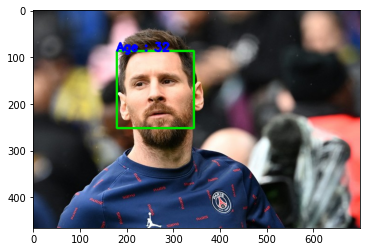

In [ ]:
print('Lionel Messi \nActual: 35 (2022)')
process_and_predict('./messi.jpeg')

Kim Jisoo 
Actual: Woman
Predict: 27


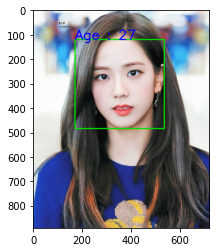

In [ ]:
print('Kim Jisoo \nActual: Woman')
process_and_predict('./jisoo.jpg')

Leonardo DiCaprio 
Actual: 47 (2022)
Predict: 43


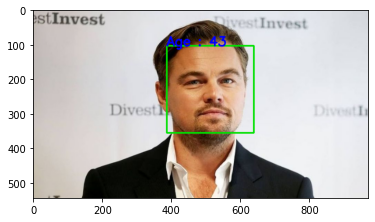

In [ ]:
print('Leonardo DiCaprio \nActual: 47 (2022)')
process_and_predict('./dicaprio.jpg')

Mariah Carey 
Actual: 53 (2022)
Predict: 41


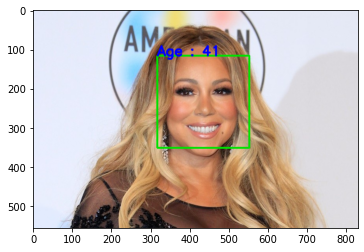

In [ ]:
print('Mariah Carey \nActual: 53 (2022)')
process_and_predict('./mariah.jpg')

Madonna 
Actual: 63 (2022)
Predict: 52


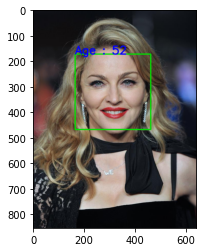

In [ ]:
print('Madonna \nActual: 63 (2022)')
process_and_predict('./madonna.jpg')

Sylvester Stallone 
Actual: 75 (2022)
Predict: 71


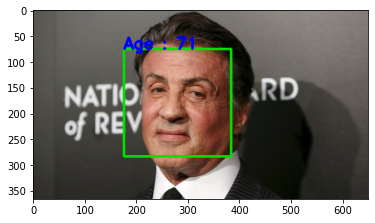

In [ ]:
print('Sylvester Stallone \nActual: 75 (2022)')
process_and_predict('./stallone.jpg')

In [ ]:
# Code for real test through webcam
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

# Memulai streaming video dari webcam
video_stream()
# Label untuk video
label_html = 'Capturing...'
bbox = ''
count = 0 

while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # Mengkonvert JS response ke OpenCV Image
    img = js_to_image(js_reply["img"])
    
    # Membuat transparan overlay untuk bounding box
    bbox_array = np.zeros([512, 512, 4], dtype=np.uint8)

    # grayscale image for face detection
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # get face region coordinates
    face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
    faces = face_cascade.detectMultiScale(gray)

    faces_list = []
    preds = []

    for (x,y,w,h) in faces:
      #x, y, w, h = result['box']
      x1, y1 = x + w, y + h
      
      # Ekstrak ROI wajah, konversikan dari BGR ke pemesanan saluran RGB,
      # dan mengubah ukurannya menjadi 224x224, dan lalu pre-prosess
      face_crop = gray[y:y1, x:x1]
      face_crop = cv2.cvtColor(face_crop, cv2.COLOR_BGR2RGB)
      face_crop = cv2.resize(face_crop, (224, 224))
      face_crop = np.array(face_crop).reshape(-1, 224, 224, 3)
    
      predict = trained_age_model.predict(face_crop)
      age = int(predict[0])
      #index = np.argmax(predict[0])
      #age = class_list[index]

      label = "Age : "+ str(age)

		  # Menampilkan hasil dengan label dan kotak dari frame
      bbox_array=cv2.putText(bbox_array, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 225, 0), 4)
      bbox_array=cv2.rectangle(bbox_array, (x, y), (x1, y1), (0, 225, 0), 4)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255

    # Mengkonversi overlay bbox ke dalam bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
 
    # Mengupdate bbox ke pada frame selanjutnya untuk mendapat overlay
    bbox = bbox_bytes

<IPython.core.display.Javascript object>